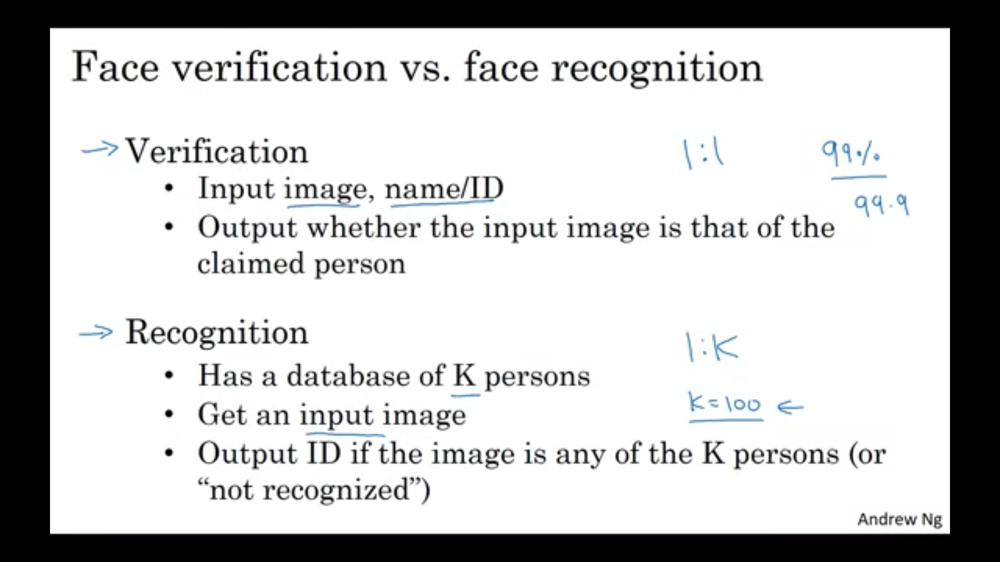

# One Shot Learning

One of the challenges of face recognition is that you need to solve the one-shot learning problem. What that means is that for most face recognition applications you need to be able to recognize a person given just one single image, or given just one example of that person's face. And, historically, deep learning algorithms don't work well if you have only one training example.

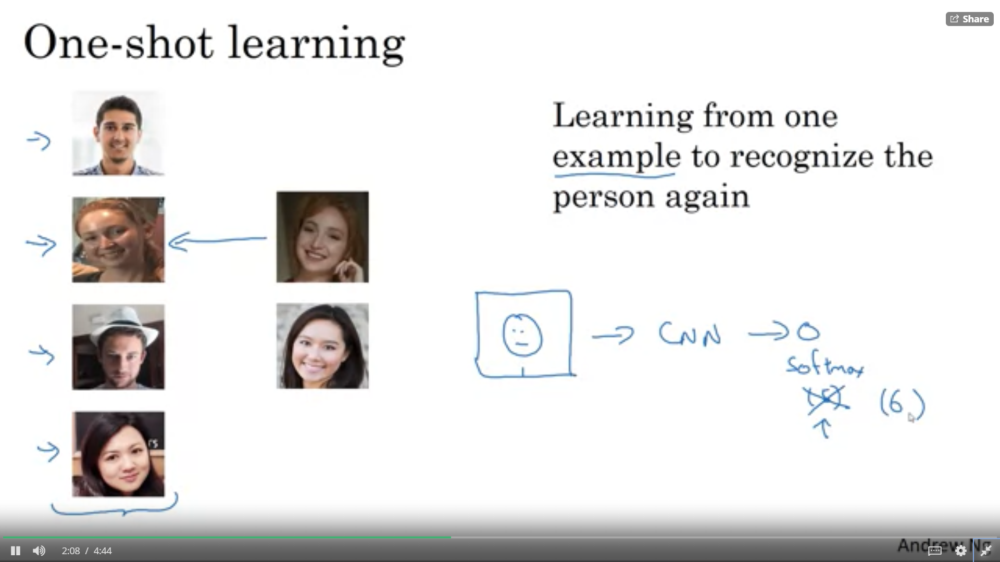

So one approach you could try is to input the image of the person, feed it too a ConvNet. And have it output a label, y, using a softmax unit with four outputs or maybe five outputs corresponding to each of these four persons or none of the above. So that would be 5 outputs in the softmax. But this really doesn't work well. Because if you have such a small training set it is really not enough to train a robust neural network for this task. And also what if a new person joins your team? So now you have 5 persons you need to recognize, so there should now be six outputs. Do you have to retrain the ConvNet every time? That just doesn't seem like a good approach

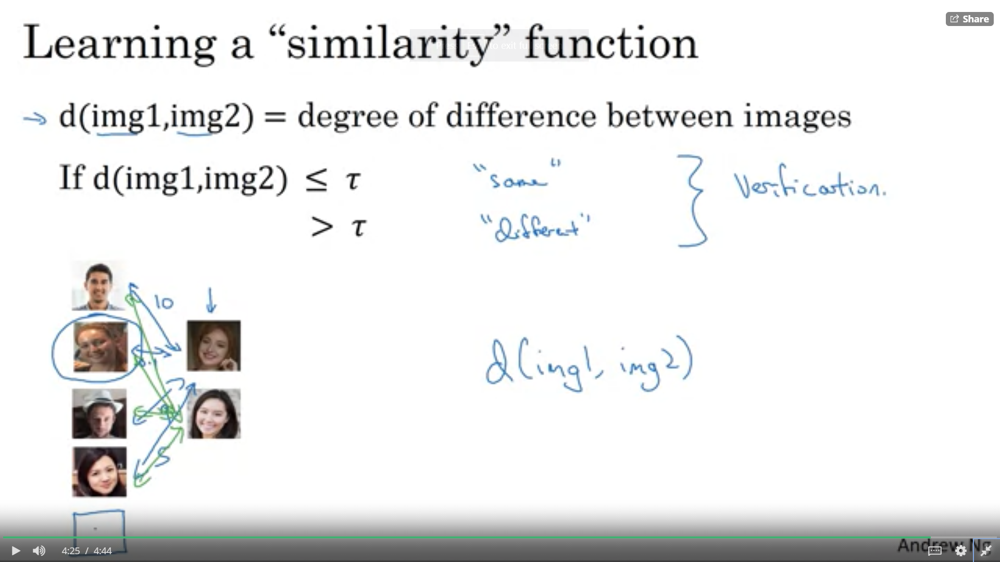

Notice how this allows you to solve the one-shot learning problem. So long as you can learn this function d, which inputs a pair of images and tells you, basically, if they're the same person or different persons. Then if you have someone new join your team, you can add a fifth person to your database, and it just works fine.

# Siamese Network

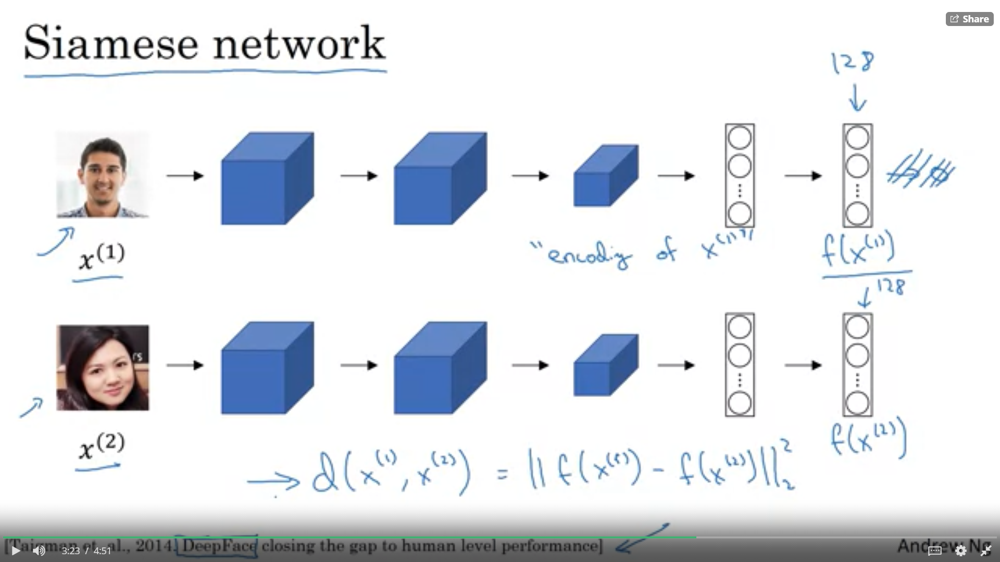

And I'm going to give this list of 128 numbers a name. I'm going to call this f of x1, and you should think of f of x1 as an encoding of the input image x1. So it's taken the input image, here this picture of Kian, and is re-representing it as a vector of 128 numbers. The way you can build a face recognition system is then that if you want to compare two pictures, let's say this first picture with this second picture here. What you can do is feed this second picture to the same neural network with the same parameters and get a different vector of 128 numbers, which encodes this second picture. So I'm going to call this second picture.So I'm going to call this encoding of this second picture f of x2, and here I'm using x1 and x2 just to denote two input images. 

 Finally, if you believe that these encodings are a good representation of these two images, what you can do is then define the image  `d of distance between x1 and x2 as the norm of the difference between the encodings of these two images.`

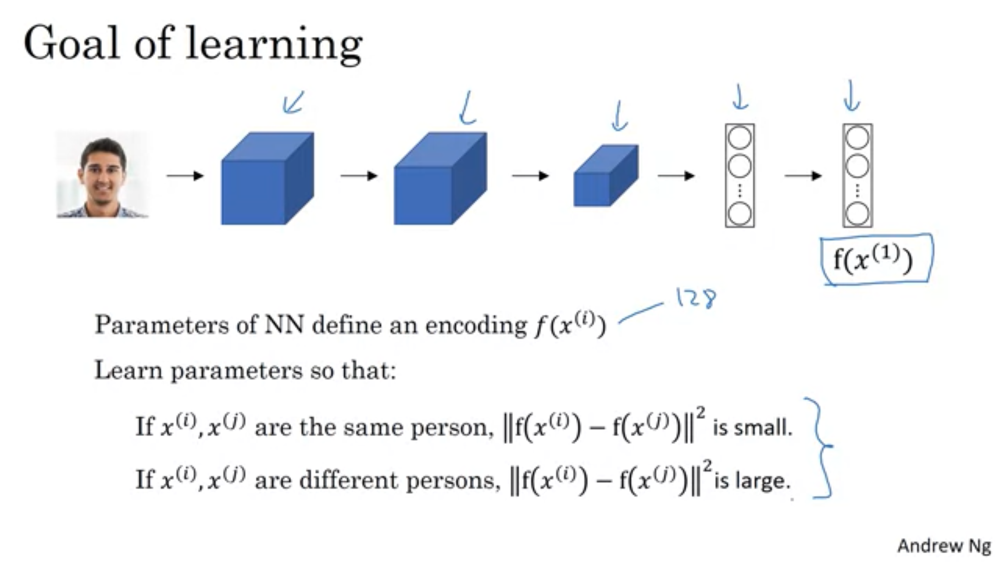

But how do you actually define an objective function to make a neural network learn to do what we just discussed here? Let's see how you can do that in the next video using the triplet loss function.

# Triplet Loss

For example, given this picture, to learn the parameters of the neural network, you have to look at several pictures at the same time. For example, given this pair of images, you want their encodings to be similar because these are the same person. Whereas, given this pair of images, you want their encodings to be quite different because these are different persons. In the terminology of the triplet loss, what you're going do is always look at one anchor image and then you want to distance between the anchor and the positive image, really a positive example, meaning as the same person to be similar. Whereas, you want the anchor when pairs are compared to the negative example for their distances to be much further apart. So, this is what gives rise to the term triplet loss, 

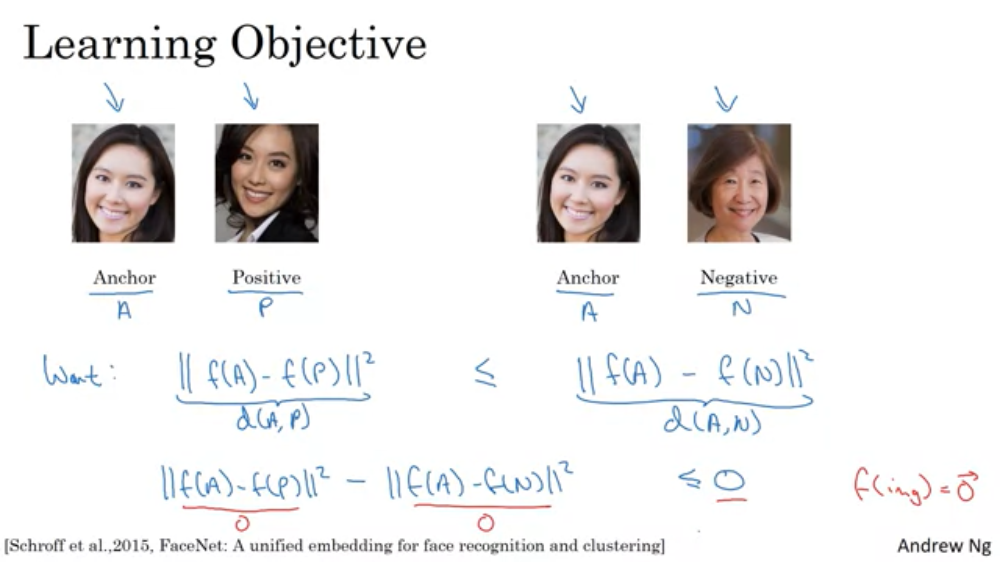

But now, we're going to make a slight change to this expression, which is one trivial way to make sure this is satisfied, is to just learn everything equals zero. If f always equals zero, then this is zero minus zero, which is zero, this is zero minus zero which is zero. And so, well, by saying f of any image equals a vector of all zeroes, you can almost trivially satisfy this equation. So, to make sure that the neural network doesn't just output zero for all the encoding, so to make sure that it doesn't set all the encodings equal to each other. Another way for the neural network to give a trivial output is if the encoding for every image was identical to the encoding to every other image, in which case, you again get zero minus zero. So to prevent a neural network from doing that, what we're going to do is modify this objective to say that, this doesn't need to be just less than or equal to zero, it needs to be quite a bit smaller than zero. So, in particular, if we say this needs to be less than negative alpha, where alpha is another hyperparameter, then this prevents a neural network from outputting the trivial solutions. 

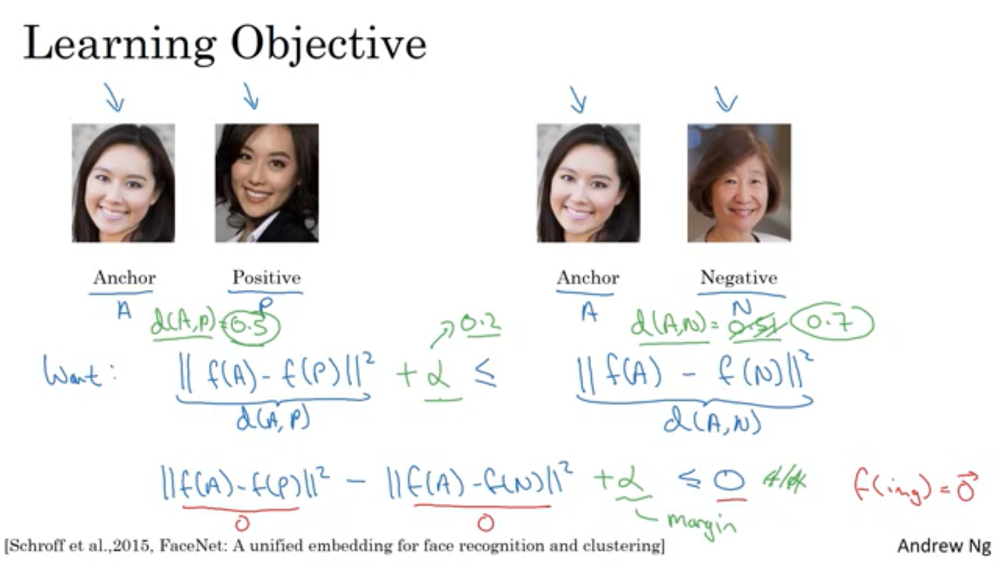

So, let's take this equation we have here at the bottom, and on the next slide, formalize it, and define the triplet loss function. 

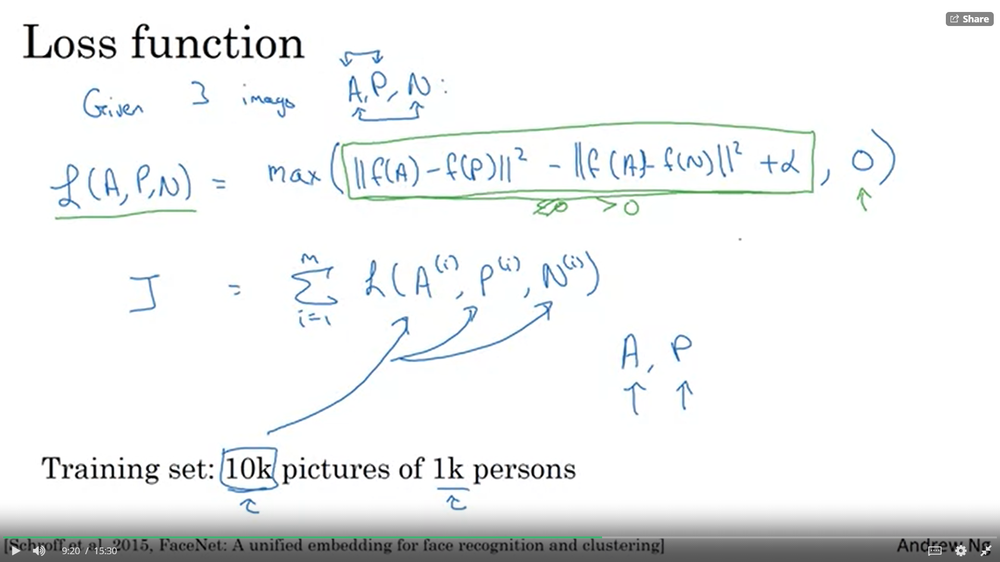

So, if you have a training set of say 10,000 pictures with 1,000 different persons, what you'd have to do is take your 10,000 pictures and use it to generate, to select triplets like this and then train your learning algorithm using gradient descent on this type of cost function, which is really defined on triplets of images drawn from your training set.

So the purpose of training your system, you do need a dataset where you have multiple pictures of the same person. That's why in this example, I said if you have 10,000 pictures of 1,000 different person, so maybe have 10 pictures on average of each of your 1,000 persons to make up your entire dataset. If you had just one picture of each person, then you can't actually train this system. But of course after training, if you're applying this, but of course after having trained the system, you can then apply it to your one shot learning problem where for your face recognition system, maybe you have only a single picture of someone you might be trying to recognize. But for your training set, you do need to make sure you have multiple images of the same person at least for some people in your training set so that you can have pairs of anchor and positive images.

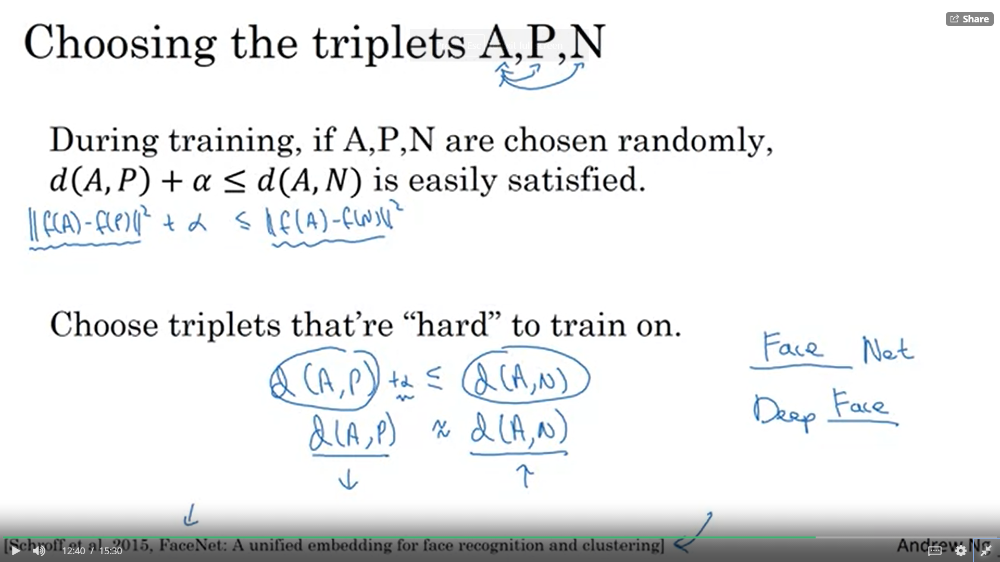

But if A and N are two randomly chosen different persons, then there is a very high chance that this will be much bigger more than the margin alpha that that term on the left. And so, the neural network won't learn much from it. So to construct a training set, what you want to do is to choose triplets A, P, and N that are hard to train on. So in particular, what you want is for all triplets that this constraint be satisfied. So, a triplet that is hard will be if you choose values for A, P, and N so that maybe d(A, P) is actually quite close to d(A,N).m

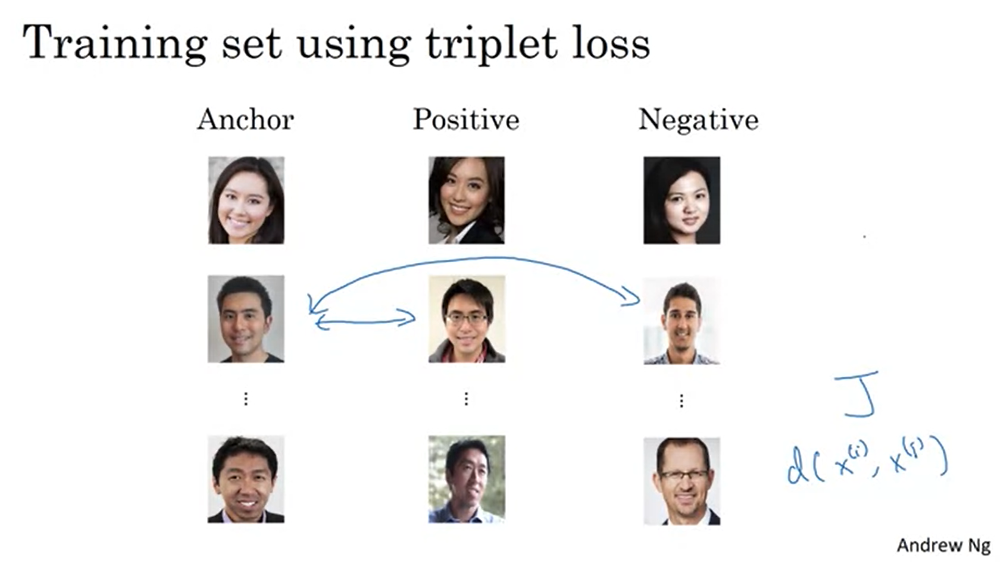

 So, here is our triple with an anchor and a positive, both for the same person and the negative of a different person. Here's another one where the anchor and positive are of the same person but the anchor and negative are of different persons and so on. `And what you do having defined this training sets of anchor positive and negative triples is use gradient descent to try to minimize the cost function J we defined on an earlier slide, and that will have the effect of that propagating to all of the parameters of the neural network in order to learn an encoding so that d of two images will be small when these two images are of the same person, and they'll be large when these are two images of different persons`. So, that's it for the triplet loss and how you can train a neural network for learning and an encoding for face recognition.

# Face Verification and Binary Classification


The Triplet Loss is one good way to learn the parameters of a continent for face recognition. There's another way to learn these parameters. Let me show you how face recognition can also be posed as a straight binary classification problem. Another way to train a neural network, is to take this pair of neural networks to take this Siamese Network and have them both compute these embeddings, maybe 128 dimensional embeddings, maybe even higher dimensional, and then have these be input to a logistic regression unit to then just make a prediction. Where the target output will be one if both of these are the same persons, and zero if both of these are of different persons. So, this is a way to treat face recognition just as a binary classification problem. 

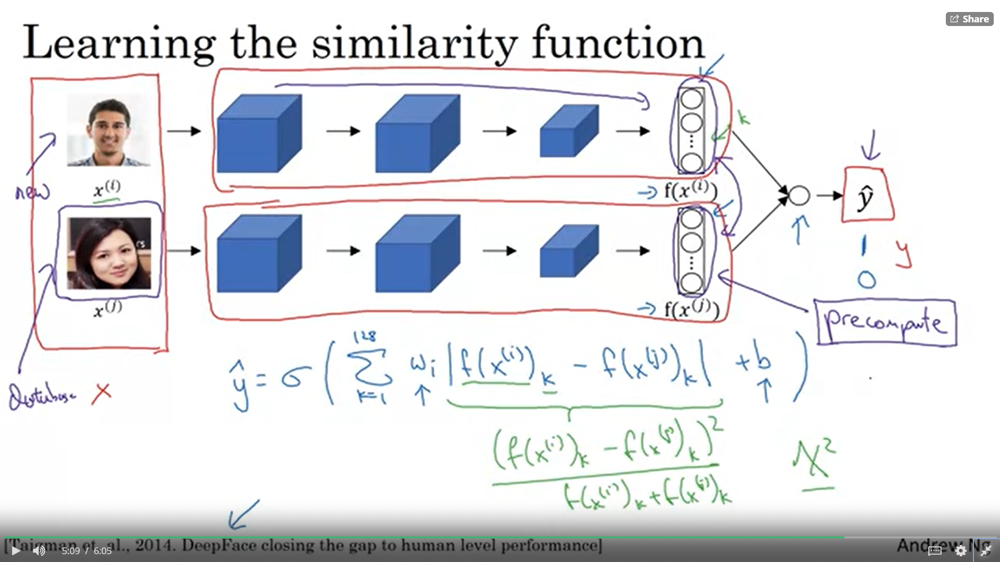

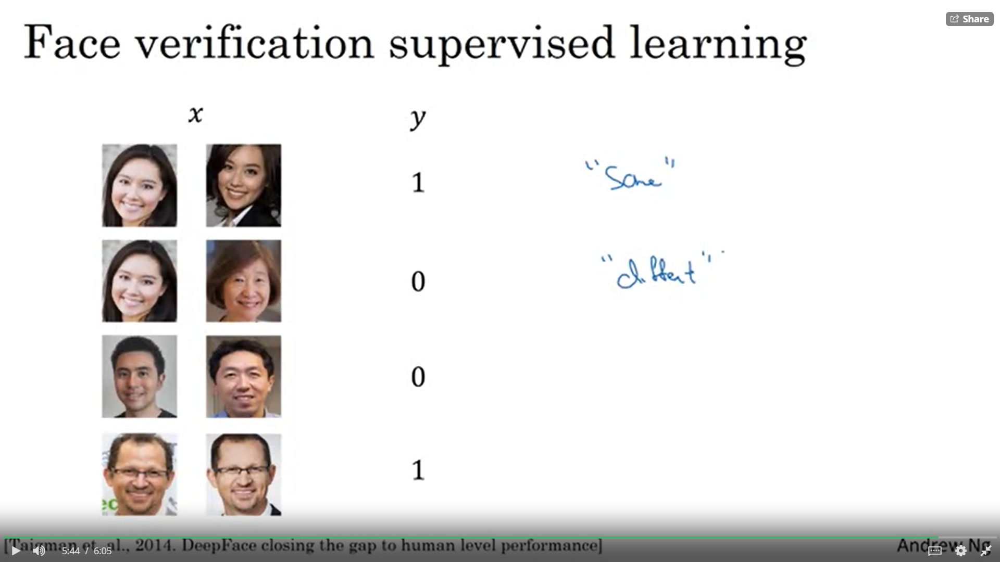

And this type of pre-computation works both for this type of Siamese Central architecture where you treat face recognition as a binary classification problem, as well as, when you were learning encodings maybe using the Triplet Loss function as described in the last couple of videos. And so just to wrap up, to treat face verification supervised learning, you create a training set of just pairs of images now is of triplets of pairs of images where the target label is one. When these are a pair of pictures of the same person and where the tag label is zero, when these are pictures of different persons and you use different pairs to train the neural network to train the scientists that were using back propagation. 